# TTB Internship (Data Science)

-- Thoranin Kaewfu (Computer Science, Thammasat University)

## Introduction

### About The Dataset
**Objective:** predict if the client will purchase a term deposit (variable y). <br>
**Sources:** The data is related with direct marketing campaigns. <br>
**Attribute information:**

   *Input variables:*

   *bank client data:*<br>
   1. age (numeric)
   2. job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid","entrepreneur","student",
                                       "blue-collar","self-employed","retired","technician","services") 
   3. marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
   4. education (categorical: "unknown","secondary","primary","tertiary")
   5. default: has credit in default? (binary: "yes","no")
   6. balance: average yearly balance, in euros (numeric) 
   7. housing: has housing loan? (binary: "yes","no")
   8. loan: has personal loan? (binary: "yes","no")

   *related with the last contact of the current campaign:* <br>
   
   9. contact: contact communication type (categorical: "unknown","telephone","cellular") 
  10. day: last contact day of the month (numeric)
  11. month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
  12. duration: last contact duration, in seconds (numeric)
  
   *other attributes:*<br>
   
  13. campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
  14. pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)
  15. previous: number of contacts performed before this campaign and for this client (numeric)
  16. poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")

  *Output variable (desired target):*<br>
  
  17. y - has the client purchased a term deposit? (binary: "yes","no")

### Goal
  You, as a data scientist in Personalized Marketing Team, are trying to find the opportunity to increase time deposit offering. 

  1. how are you going to recommend to Business Unit (with compelling data-driven evidence) to boost the following metrics:  <br>
   - conversion rate
   - sales volume
  2. If you can collect more data, what would you collect to improve the recommendation or the metrics

  How are you going to create a banner (or banners) to personalized time deposit offering based on the data to achieve these 3 metrics (conversion rate and sales volume)at the same time?  

____

### Import packages and load the data set.

In [676]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import sklearn

from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from collections import Counter

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor


In [677]:
# Setup DPI
plt.rcParams['figure.dpi'] = 500

In [678]:
%config Completer.use_jedi = False

sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

np.set_printoptions(threshold=sys.maxsize)

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
%matplotlib inline

In [679]:
# Read a dataset file form Github link
url = 'https://raw.githubusercontent.com/ThoraninKaewfu/Dataset/main/datascience-full.csv'
bank_client = pd.read_csv(url, sep=';')

## Data Exploration

In [680]:
# Show the information of dataset and check a type of data

print(bank_client.shape)
print(bank_client.info())
bank_client.head()

(45211, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB
None


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [681]:
# Select a numeric and category column name of dataset
numeric_col = bank_client.select_dtypes(include=['int64']).columns
category_col = bank_client.select_dtypes(include=['object']).columns

In [682]:
# Print unique values for each column
for col in category_col:
    print(col, "(", len(bank_client[col].unique()) , "values):\n", np.sort(bank_client[col].unique()))

job ( 12 values):
 ['admin.' 'blue-collar' 'entrepreneur' 'housemaid' 'management' 'retired'
 'self-employed' 'services' 'student' 'technician' 'unemployed' 'unknown']
marital ( 3 values):
 ['divorced' 'married' 'single']
education ( 4 values):
 ['primary' 'secondary' 'tertiary' 'unknown']
default ( 2 values):
 ['no' 'yes']
housing ( 2 values):
 ['no' 'yes']
loan ( 2 values):
 ['no' 'yes']
contact ( 3 values):
 ['cellular' 'telephone' 'unknown']
month ( 12 values):
 ['apr' 'aug' 'dec' 'feb' 'jan' 'jul' 'jun' 'mar' 'may' 'nov' 'oct' 'sep']
poutcome ( 4 values):
 ['failure' 'other' 'success' 'unknown']
y ( 2 values):
 ['no' 'yes']


In [683]:
# Check a sum of NULL value
bank_client.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [684]:
for col in category_col:
    print(f"\033[1m\033[94m{col} \n{20 * '-'}\033[0m")    
    print(bank_client[col].value_counts(), "\n")
    
print(bank_client.nunique(axis=1))

job 
--------------------
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64 

marital 
--------------------
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64 

education 
--------------------
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64 

default 
--------------------
no     44396
yes      815
Name: default, dtype: int64 

housing 
--------------------
yes    25130
no     20081
Name: housing, dtype: int64 

loan 
--------------------
no     37967
yes     7244
Name: loan, dtype: int64 

contact 
--------------------
cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64 

month 
--------------------
may    13766
jul     6895
aug    

In [685]:
bank_client.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [686]:
# Visualize distribution of dataset information
grr = pd.plotting.scatter_matrix(bank_client, figsize=(20, 20), marker='o', hist_kwds={'bins': 20}, s=20, alpha=.8, diagonal='kde')
plt.show()

Text(0.5, 1.0, 'Correlation Heatmap')

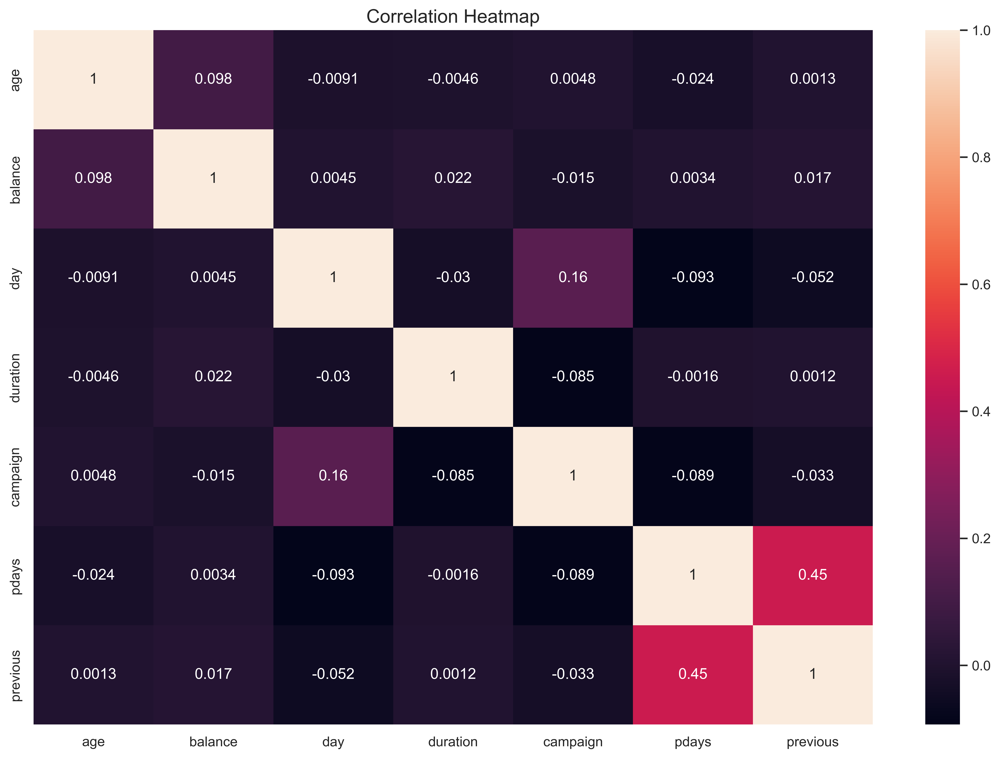

In [687]:
# Heatmap for show the correlation for each features 
fig = plt.figure(figsize=(15, 10))

heatmap = sns.heatmap(bank_client.corr(),annot = True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':15})

> Most of feature are category type; hence, this heatmap does not help much. 

## Data Visualization and Analysis
With a sound knowledge of the distribution of key variables, further analysis of each customer characteristic can be carried out to investigate its influence on the subscription rate.

**Point of analysis**
1. Observe the overall client data of this dataset.
2. Analyze client subscription decisions through the age, balance, and job feature.
3. Analyze the campaign contact period for client.

##### 1. Observe the overall client data of this dataset.

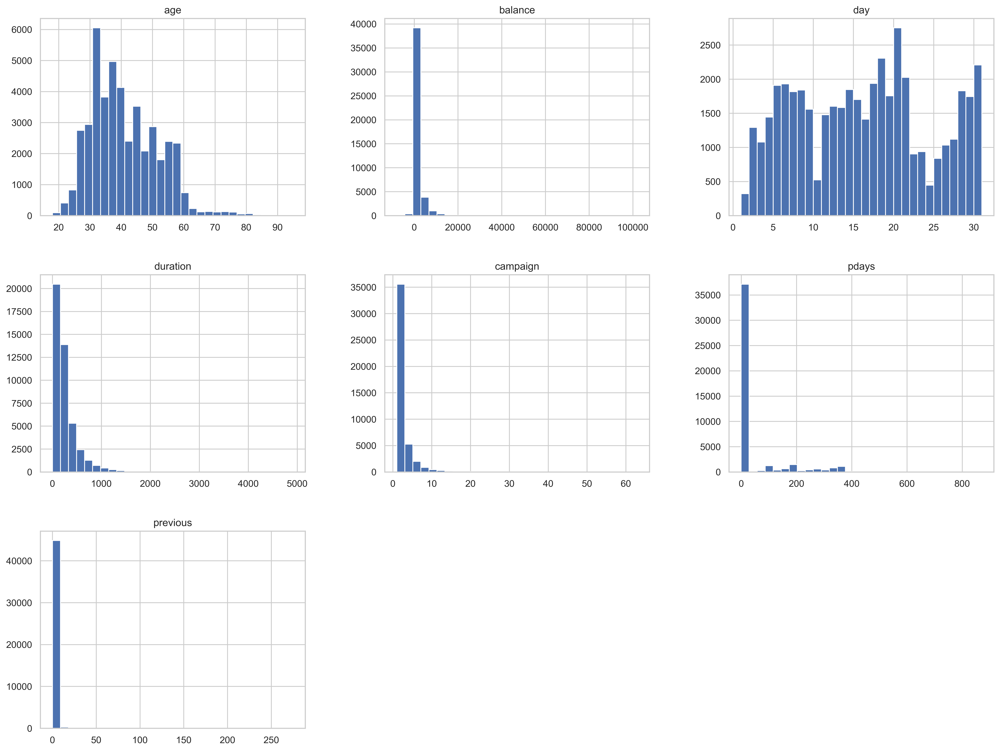

In [688]:
# Visualize distributions of numerical features with histograms

%matplotlib inline

bank_client[numeric_col].hist(bins=30, figsize=(20,15))
plt.savefig("attribute_histogram_plots")
plt.show()

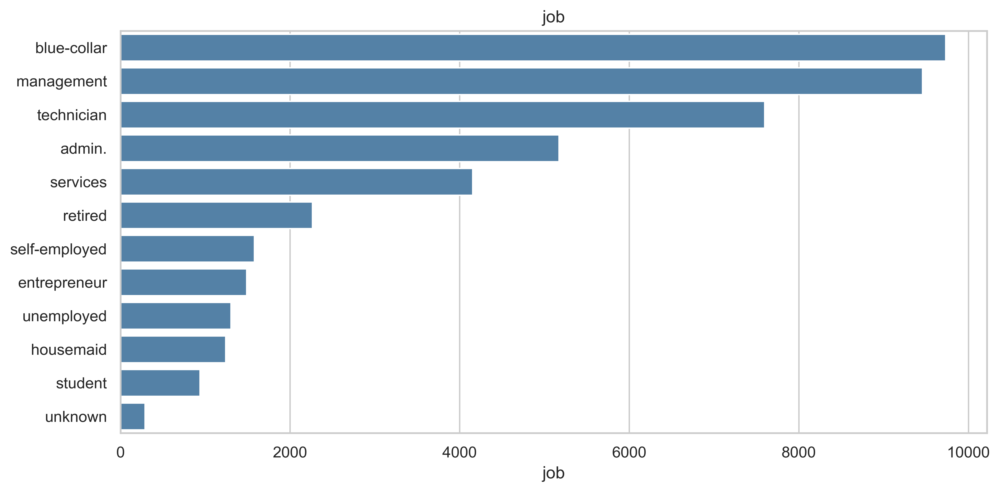

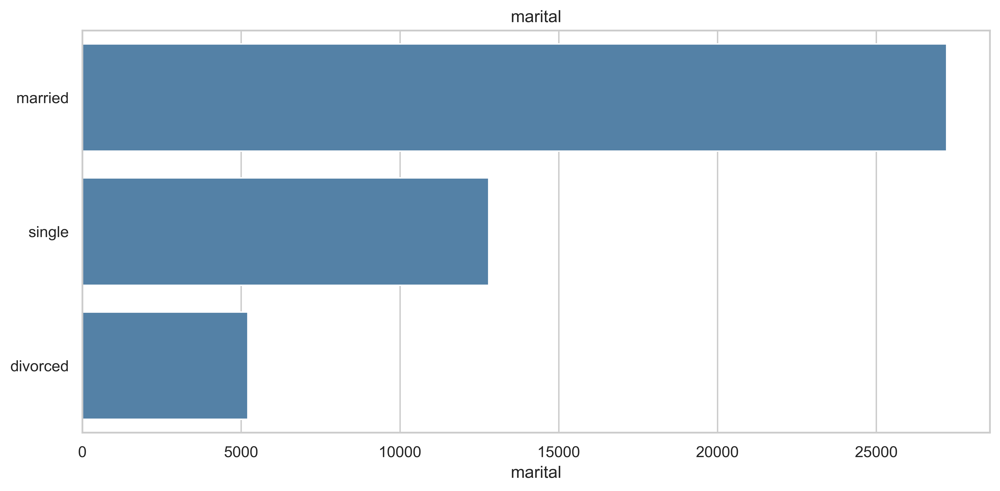

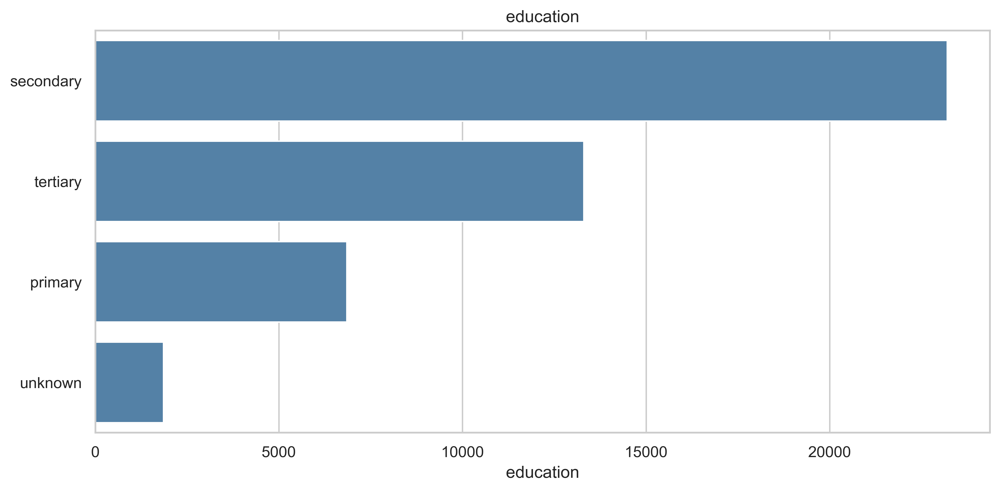

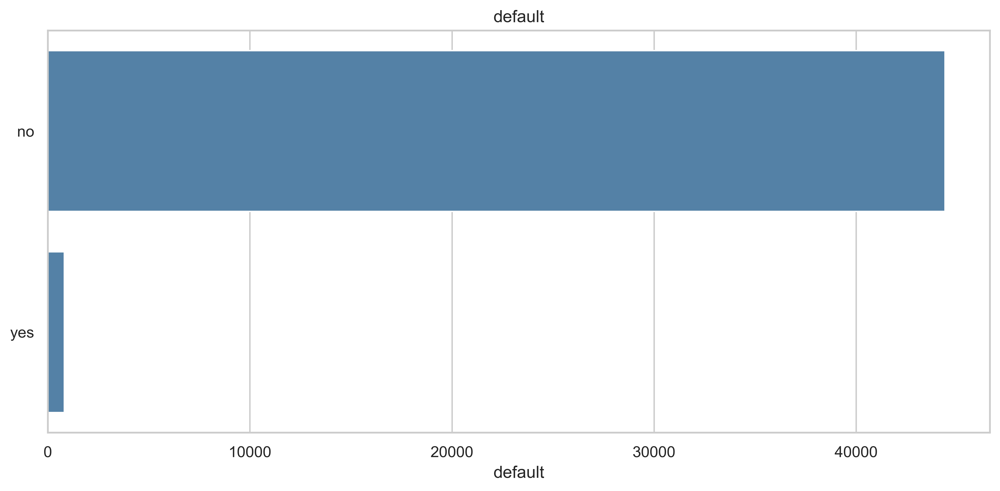

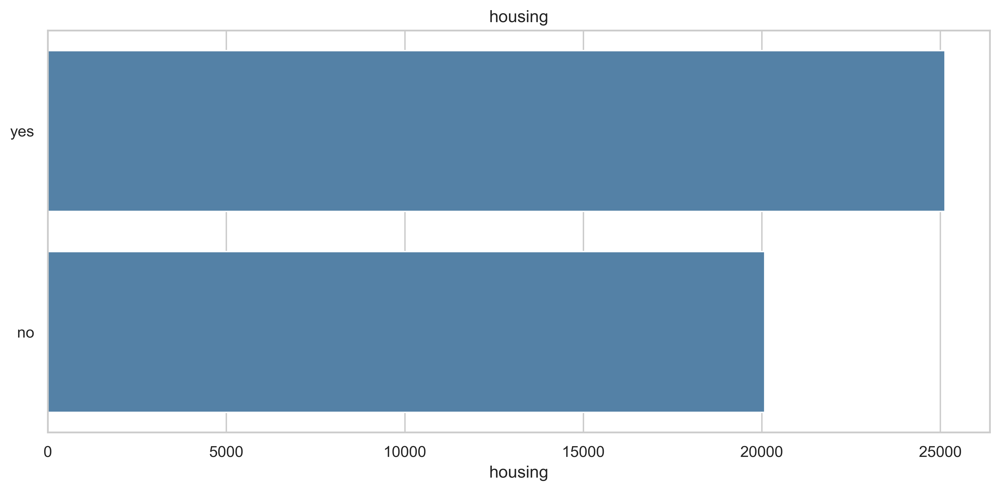

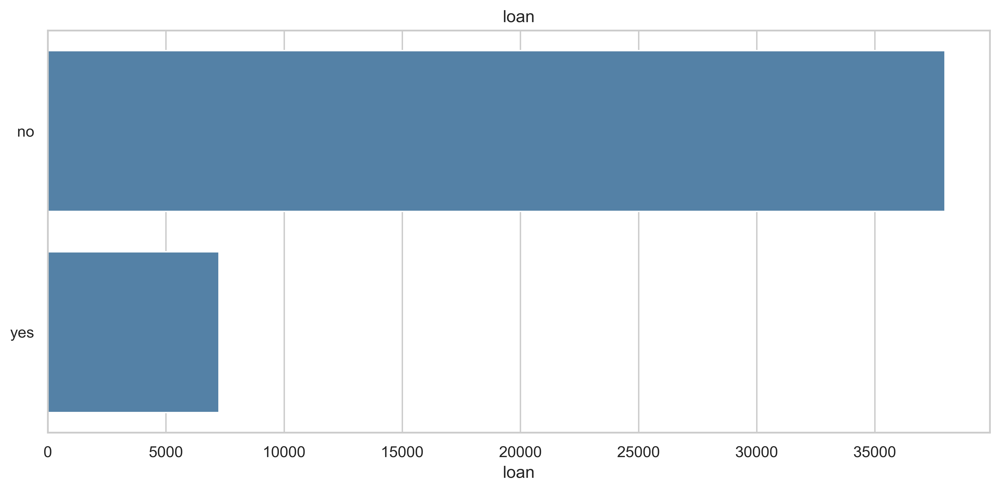

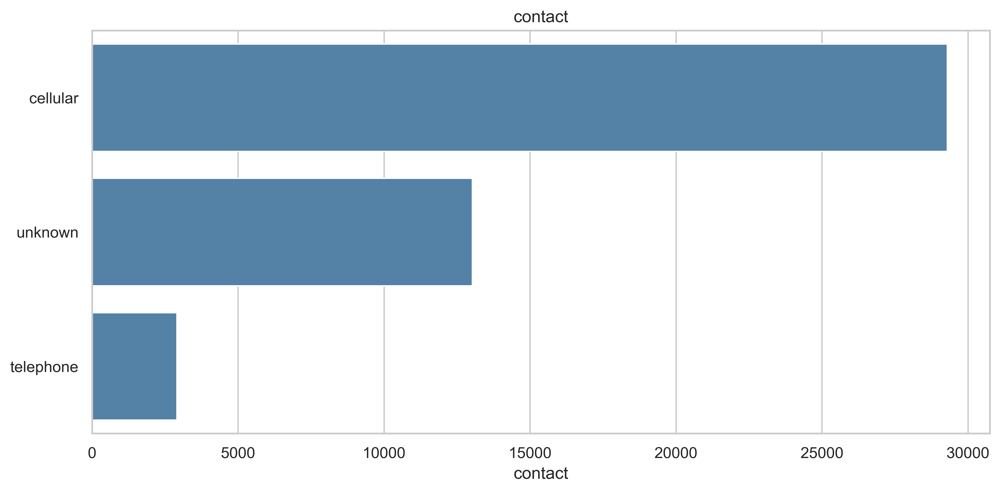

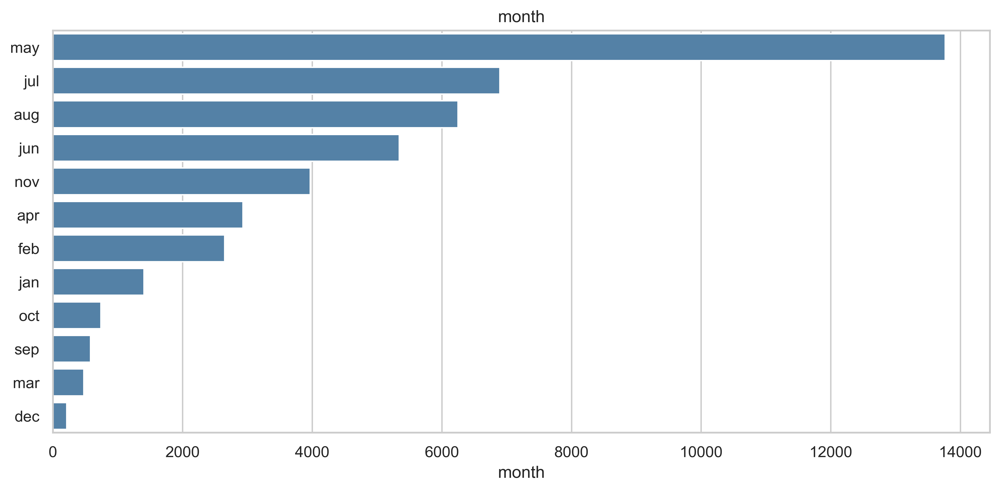

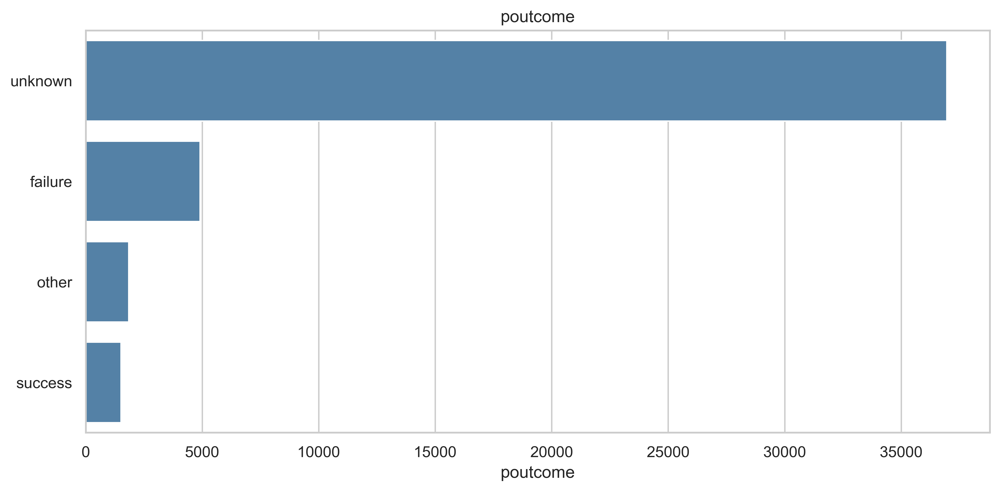

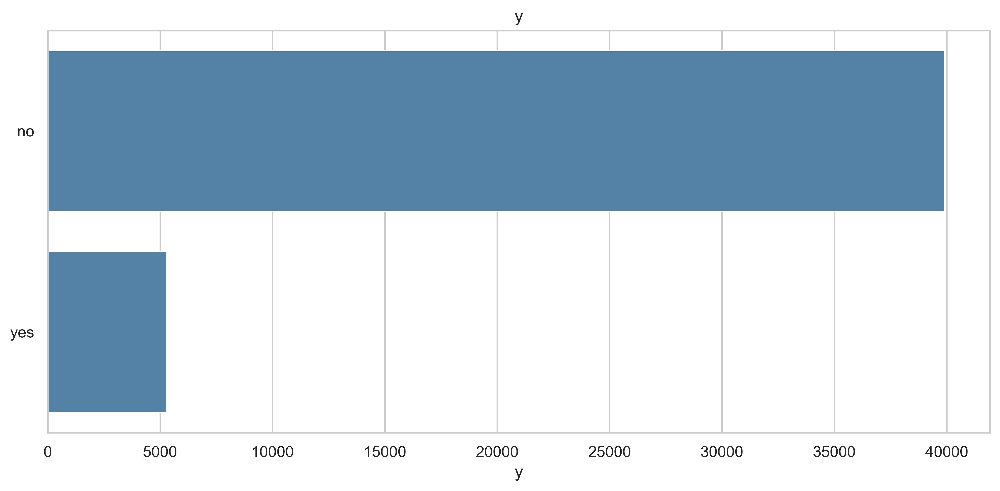

In [689]:
# Visualize a count values of category feature 
for col in category_col:
    plt.figure(figsize=(10,5))    
    sns.barplot(x=bank_client[col].value_counts(), y=bank_client[col].value_counts().index, data=bank_client, color='steelblue')    
    plt.title(col)    
    plt.tight_layout()

Our observations:

- Job: The audiences of these campaigns target mostly administrators, blue-collars, and technicians. <br>
- Marital status: Most of them are married; married clients are twice as single people. <br>
- Education: Most clients have university education level while illiterate people are very less. <br>
- default/credit: Most people have no default stay on their credit file. <br>
- housing: Most people have no housing loan. <br>
- loan: Most people have no personal loan. <br>
- contact: Common means of communication are cellular. <br>
- month: May is the busy month and December is the least busy month. <br>
- day of week: Thursday is the most busy day while Friday is the least busy day of the week.

#### 2. Analyze client subscription decisions through the age, balance, and job feature.

**Subscription to the term deposit**

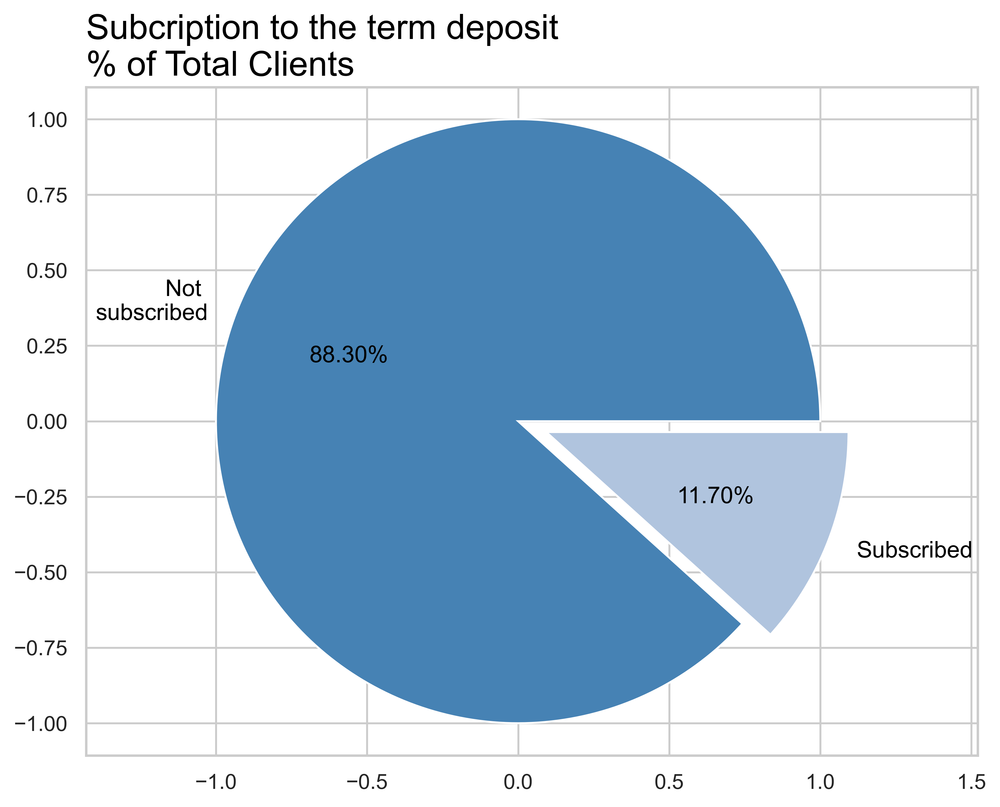

In [690]:
# Pie chart
labels = ["Not \nsubscribed", "Subscribed"]
explode = (0, 0.1)  # only "explode" the second slice (i.e. 'Subscribed')

# depicting the visualization 
fig = plt.figure() 
ax = fig.add_axes([0,0,1,1]) 

ax.pie(bank_client['y'].value_counts(), 
       labels = labels,
       explode = explode,
       autopct ='%1.2f%%',
       frame = True,
       textprops = dict(color ="black", size=12),
       colors = ['steelblue', 'lightsteelblue']) 

ax.axis('equal') 
plt.title('Subcription to the term deposit\n% of Total Clients',
     loc='left',
     color = 'black', 
     fontsize = '18')

plt.show()

> 11.70% customers subscribed to the term deposit. Classes of dataset> are imbalanced where positive values (subscribed) are only 11.70%.

**Visualize the subscription rate by age**

In [691]:
# Setup temp of dataframe
temp_df = bank_client
temp_df.loc[temp_df["age"] < 30,  'age_group'] = 20
temp_df.loc[(temp_df["age"] >= 30) & (temp_df["age"] <= 39), 'age_group'] = 30
temp_df.loc[(temp_df["age"] >= 40) & (temp_df["age"] <= 49), 'age_group'] = 40
temp_df.loc[(temp_df["age"] >= 50) & (temp_df["age"] <= 59), 'age_group'] = 50
temp_df.loc[temp_df["age"] >= 60, 'age_group'] = 60

In [692]:
age_rate_sub = temp_df[temp_df['y'] == 'yes'][['age_group', 'y']].groupby('age_group').count()
age_rate_nonsub = temp_df[temp_df['y'] == 'no'][['age_group', 'y']].groupby('age_group').count()

age_rate_sub.y = age_rate_sub.y/age_rate_sub.y.sum() * 100
age_rate_nonsub.y = age_rate_nonsub.y/age_rate_nonsub.y.sum() * 100
    
print(age_rate_sub)
print(age_rate_nonsub)

                   y
age_group           
20.0       17.545850
30.0       36.169408
40.0       20.098317
50.0       14.842125
60.0       11.344299
                   y
age_group           
20.0       10.883723
30.0       40.519012
40.0       26.531737
50.0       19.099745
60.0        2.965783


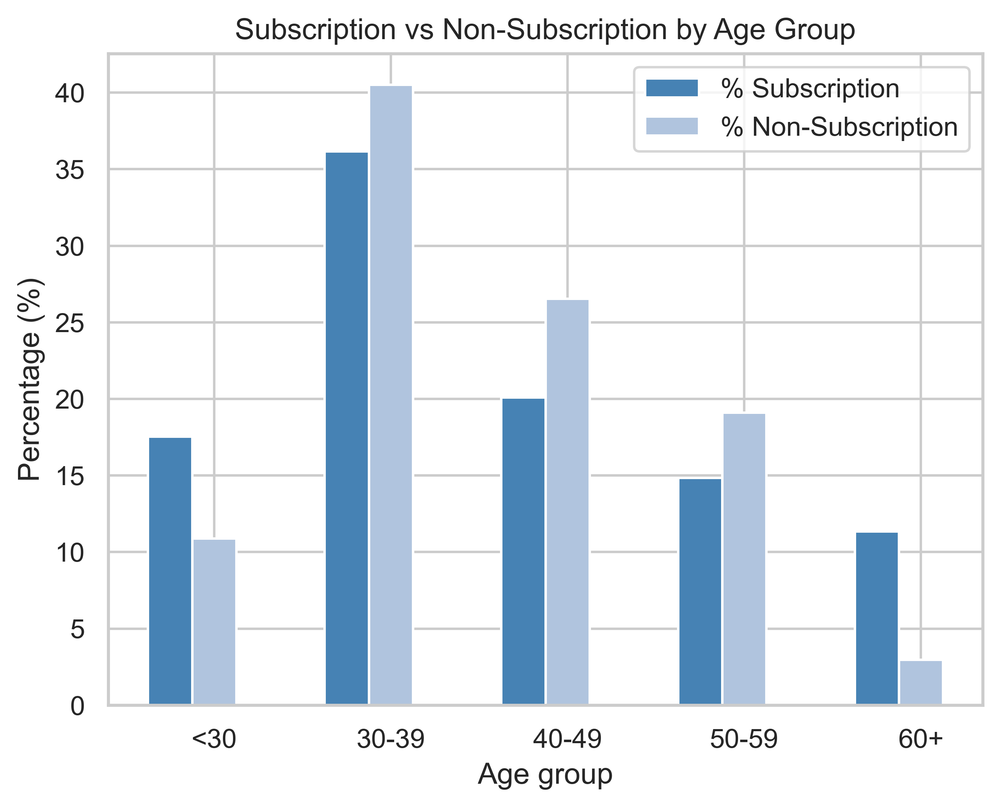

In [693]:
# set width of bar
barWidth = 0.25

# Set position of bar on X axis
br1 = np.arange(5)
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, age_rate_sub.y, color ='steelblue', width = barWidth,
        label ='% Subscription')
plt.bar(br2, age_rate_nonsub.y, color ='lightsteelblue', width = barWidth,
        label ='% Non-Subscription')
 
# Adding title
plt.title('Subscription vs Non-Subscription by Age Group')
plt.xlabel('Age group')
plt.ylabel('Percentage (%)')
plt.xticks([r + barWidth for r in range(5)],
        ['<30', '30-39', '40-49', '50-59', '60+'])
 
plt.legend()
plt.show()

> From the above graph, it can be seen that the percentage with the highest subscriptions is client aged over 60 years old and the rate decreases with age.

In [694]:
count_age_response = pd.crosstab(temp_df['y'], temp_df['age_group']).apply(lambda x: x/x.sum() * 100)
count_age_response = count_age_response.transpose()

age = pd.DataFrame(temp_df['age_group'].value_counts())
age = age.sort_index()
age['% Contacted'] = age['age_group']*100/age['age_group'].sum()
age['% Subscription'] = count_age_response['yes']
age.drop('age_group',axis = 1 ,inplace = True)
age

,% Contacted,% Subscription
20.0,11.663091,17.599090
30.0,40.010175,10.575488
40.0,25.779125,9.120549
50.0,18.601668,9.334126
60.0,3.945942,33.632287


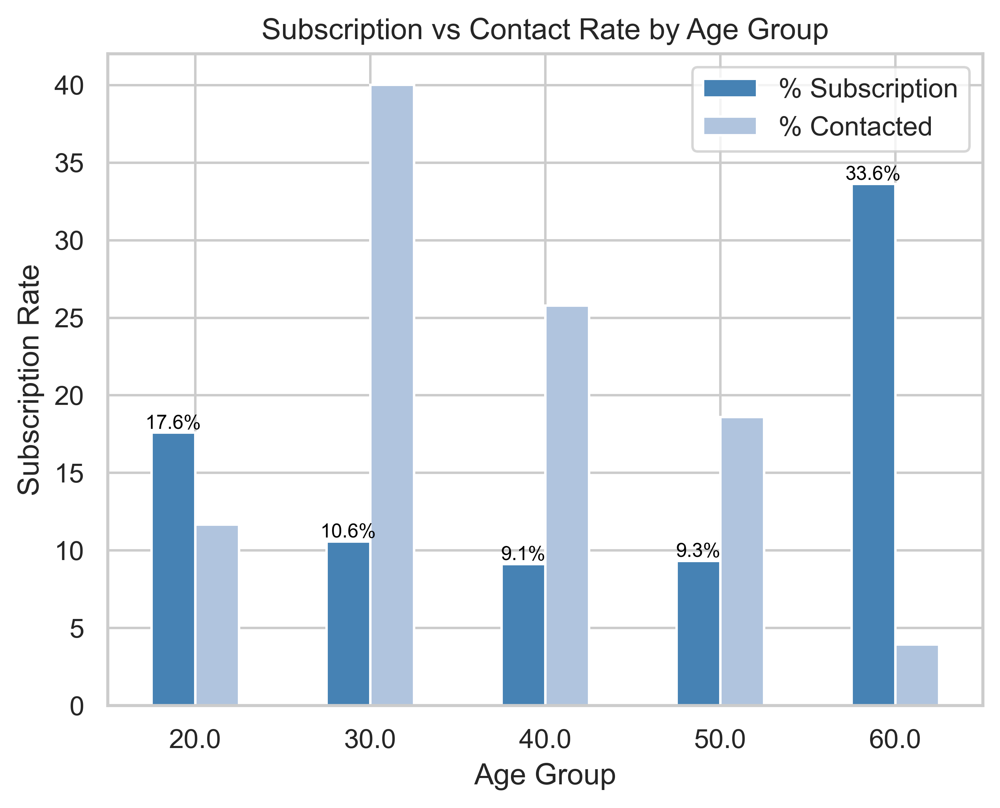

In [695]:

# Setup plot
plot_age = age[['% Subscription','% Contacted']].plot(kind = 'bar',
                                               color = ('steelblue','lightsteelblue'))
 
# Adding title
plt.title('Subscription vs Contact Rate by Age Group')
plt.ylabel('Subscription Rate')
plt.xlabel('Age Group')
plt.xticks(rotation = 'horizontal')

# label the bar
for rec, label in zip(plot_age.patches,
                      age['% Subscription'].round(1).astype(str)):
    plot_age.text(rec.get_x() + rec.get_width()/2, 
                      rec.get_height() + 0.25, 
                      label+'%',  
                      ha = 'center', 
                      color = 'black',
                      size = 8)
 
plt.legend()
plt.show()

**Insights: Increase contacts or target the oldest and youngest more.**

It is not surprising to see such a pattern because the main investment objective of older people is saving for retirement while the middle-aged group tend to be more aggressive with a main objective of generating high investment income. Term deposits, as the least risky investment tool, are more preferable to the eldest. <br>
The youngest may not have enough money or professional knowledge to engage in sophisticated investments, such as stocks and mutual funds. Term deposits provide liquidity and generate interest incomes that are higher than the regular saving account, so term deposits are ideal investments for students.

But if we look at the light blue bar graph, we can see that the bank focuses on marketing to middle-aged customers rather than younger and older customers.

**Visualize the subscription rate by balance**

In [696]:
temp_df.loc[temp_df["balance"] <= 0,  'balance_group'] = 'no balance'
temp_df.loc[(temp_df["balance"] > 0) & (temp_df["balance"] <= 1000), 'balance_group'] = 'low balance'
temp_df.loc[(temp_df["balance"] > 1000) & (temp_df["balance"] <= 5000), 'balance_group'] = 'average balance'
temp_df.loc[(temp_df["balance"] > 5000), 'balance_group'] = 'high balance'

To identify the trend more easily, clients are categorized into four groups based on their levels of balance:

- No Balance: clients with a negative balance.
- Low Balance: clients with a balance between 0 and 1000 euros
- Average Balance: clients with a balance between 1000 and 5000 euros.
- High Balance: clients with a balance greater than 5000 euros.

In [697]:
temp_df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,age_group,balance_group
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,50.0,average balance
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,40.0,low balance
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,30.0,low balance
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,40.0,average balance
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,30.0,low balance


In [698]:
# Setup a new dataframe by balance_group (Subscription, Non-Subscription) groupby and then transform to percentage

balance_rate_sub = temp_df[temp_df['y'] == 'yes'][['balance_group', 'y']].groupby('balance_group').count()
balance_rate_nonsub = temp_df[temp_df['y'] == 'no'][['balance_group', 'y']].groupby('balance_group').count()

balance_rate_sub.y = balance_rate_sub.y/balance_rate_sub.y.sum() * 100
balance_rate_nonsub.y = balance_rate_nonsub.y/balance_rate_nonsub.y.sum() * 100

print(balance_rate_sub)
print(balance_rate_nonsub)

                         y
balance_group             
average balance  34.165249
high balance      8.338060
low balance      48.005294
no balance        9.491397
                         y
balance_group             
average balance  24.996243
high balance      6.021742
low balance      52.003908
no balance       16.978107


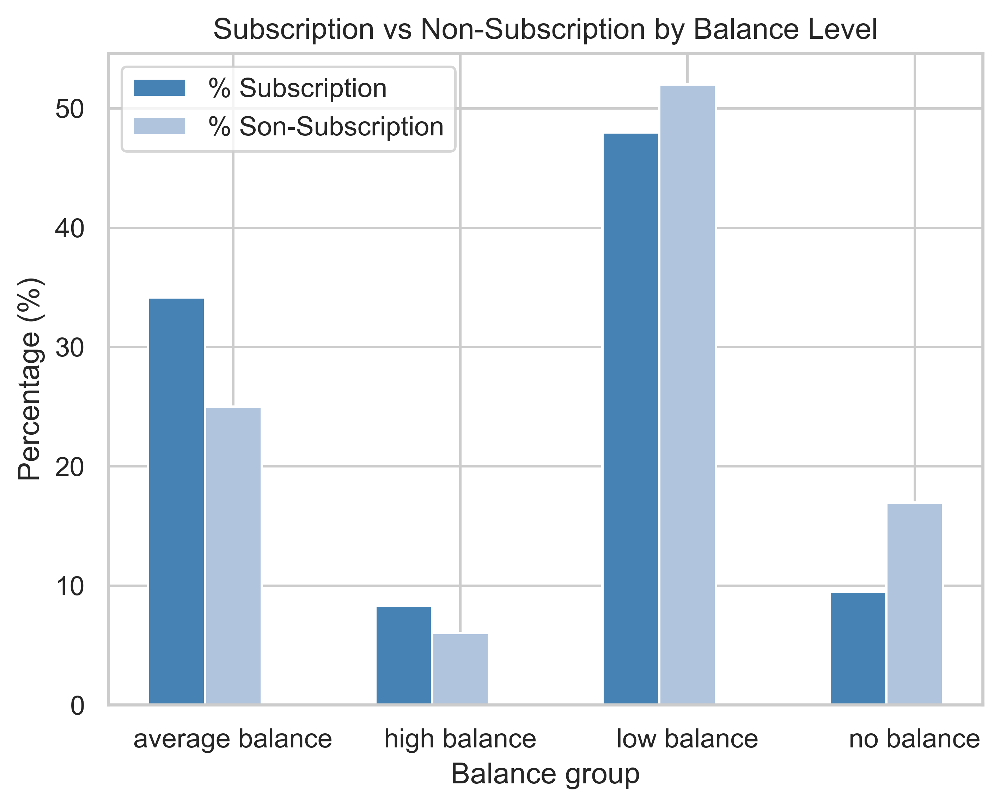

In [699]:
# set width of bar
barWidth = 0.25

# Set position of bar on X axis
br1 = np.arange(4)
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]

# Make the plot
plt.bar(br1, balance_rate_sub.y, color ='steelblue', width = barWidth,
        label ='% Subscription')
plt.bar(br2,  balance_rate_nonsub.y, color ='lightsteelblue', width = barWidth,
        label ='% Son-Subscription')
 
# Adding title
plt.title('Subscription vs Non-Subscription by Balance Level')
plt.xlabel('Balance group')
plt.ylabel('Percentage (%)')
plt.xticks([r + barWidth for r in range(4)],
        balance_rate_sub.index)
 
plt.legend()
plt.show()

> From the graph showing the percentage of Subscription and Non-Subscription of all client divided into Balance Level, it can be seen that the group of client with the highest Subscription is the low balance which has a percentage of Non-Subscription Also high, which is higher than the subscription percentage. <br>
> In the Average balance group, there is a percentage of Subscriptions, followed by Low Balance, but there are more Subscriptions than Non-Subscriptions.

In [700]:
count_balance_response = pd.crosstab(temp_df['y'], temp_df['balance_group']).apply(lambda x: x/x.sum() * 100)
count_balance_response = count_balance_response.transpose()

balance = pd.DataFrame(temp_df['balance_group'].value_counts())
balance = balance.reindex(balance_rate_sub.index)
balance['% Contacted'] = balance['balance_group']*100/balance['balance_group'].sum()
balance['% Subscription'] = count_balance_response['yes']
balance.drop('balance_group',axis = 1,inplace = True)

balance

,% Contacted,% Subscription
balance_group,,
average balance,26.068877,15.331750
high balance,6.292716,15.500879
low balance,51.536131,10.896996
no balance,16.102276,6.895604


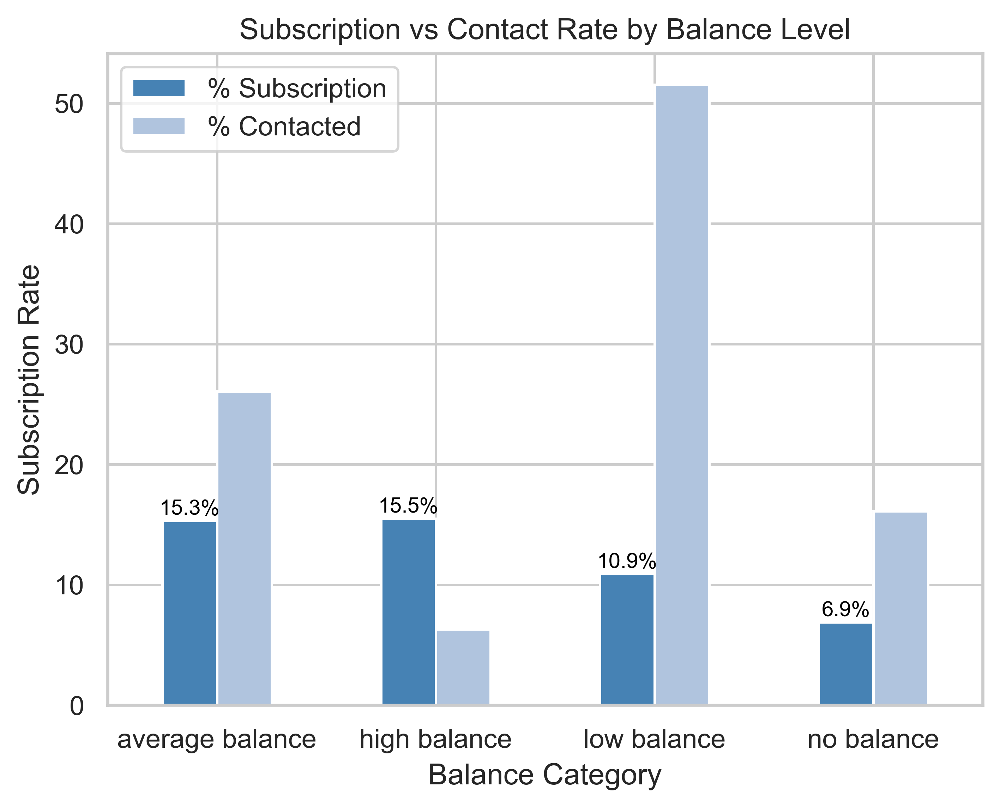

In [701]:
# Setup plot
plot_balance = balance[['% Subscription','% Contacted']].plot(kind = 'bar',
                                               color = ('steelblue','lightsteelblue'))
 
# Adding title
plt.title('Subscription vs Contact Rate by Balance Level')
plt.ylabel('Subscription Rate')
plt.xlabel('Balance Category')
plt.xticks(rotation = 'horizontal')

# label the bar
for rec, label in zip(plot_balance.patches,
                      balance['% Subscription'].round(1).astype(str)):
    plot_balance.text(rec.get_x() + rec.get_width()/2, 
                      rec.get_height() + 0.5, 
                      label+'%',  
                      ha = 'center', 
                      color = 'black',
                      size = 8.7)
 
plt.legend()
plt.show()

**Insights: Increase contacts or target the high balance more**

This bar chart indicates a positive correlation between clients’ balance levels and subscription rate. <br>
In the future, the bank should shift its marketing focus to high-balance customers to secure more term deposits.

**Visualize the subscription rate by job**

In [702]:
count_job_response = pd.crosstab(temp_df['y'], temp_df['job']).apply(lambda x: x/x.sum() * 100)
count_job_response = count_job_response.transpose()

count_job_response

y,no,yes
job,,
admin.,87.797331,12.202669
blue-collar,92.725031,7.274969
entrepreneur,91.728312,8.271688
housemaid,91.209677,8.790323
management,86.244449,13.755551
retired,77.208481,22.791519
self-employed,88.157061,11.842939
services,91.116996,8.883004
student,71.321962,28.678038


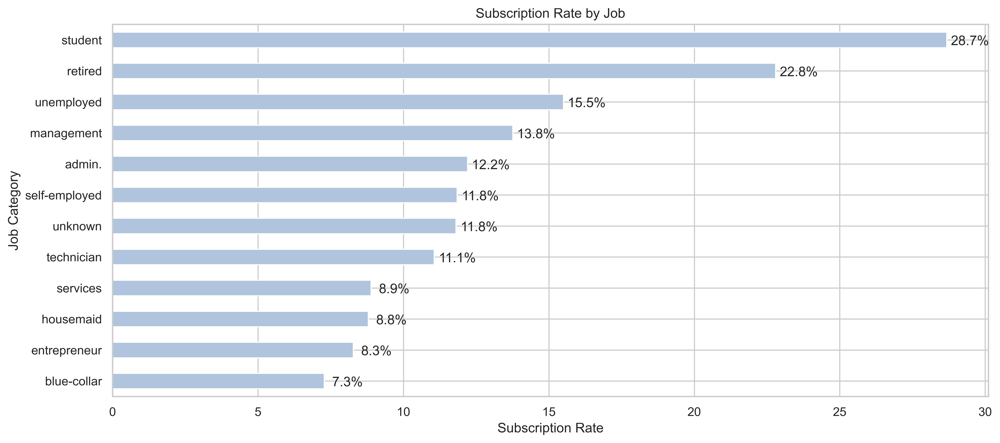

In [703]:
plot_job = count_job_response['yes'].sort_values(ascending = True).plot(kind ='barh',color = 'lightsteelblue', figsize = (14,6))
                                                                               
plt.title('Subscription Rate by Job')
plt.xlabel('Subscription Rate')
plt.ylabel('Job Category')

# Label each bar
for rec, label in zip(plot_job.patches,
                      count_job_response['yes'].sort_values(ascending = True).round(1).astype(str)):
    plot_job.text(rec.get_width()+0.8, 
                  rec.get_y()+ rec.get_height()-0.5, 
                  label+'%', 
                  ha = 'center', 
                  va='bottom')

**Insights: target students and retired clients**

As noted from the bar chart, students and retired clients account for more than 50% of subscription.

#### 3. Analyze the campaign contact period for client.

In [704]:
month_sort = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

count_month_response = pd.crosstab(temp_df['y'], temp_df['month']).apply(lambda x: x/x.sum() * 100)
count_month_response = count_month_response.transpose()
count_month_response = count_month_response.reindex(month_sort)

month = pd.DataFrame(temp_df['month'].value_counts())
month['% Contacted'] = month['month']*100/month['month'].sum()
month['% Subscription'] = count_month_response['yes']
month.drop('month',axis = 1,inplace = True)
month = month.reindex(month_sort)

month


,% Contacted,% Subscription
jan,3.103227,10.121169
feb,5.859194,16.647792
mar,1.055053,51.991614
apr,6.485147,19.679400
may,30.448342,6.719454
jun,11.813497,10.222805
jul,15.250713,9.093546
aug,13.817434,11.013286
sep,1.280662,46.459413
oct,1.632346,43.766938


([<matplotlib.axis.XTick at 0x14defb040>,
 [Text(0, 0, 'jan'),
  Text(1, 0, 'feb'),
  Text(2, 0, 'mar'),
  Text(3, 0, 'apr'),
  Text(4, 0, 'may'),
  Text(5, 0, 'jun'),
  Text(6, 0, 'jul'),
  Text(7, 0, 'aug'),
  Text(8, 0, 'sep'),
  Text(9, 0, 'oct'),
  Text(10, 0, 'nov'),
  Text(11, 0, 'dec')])

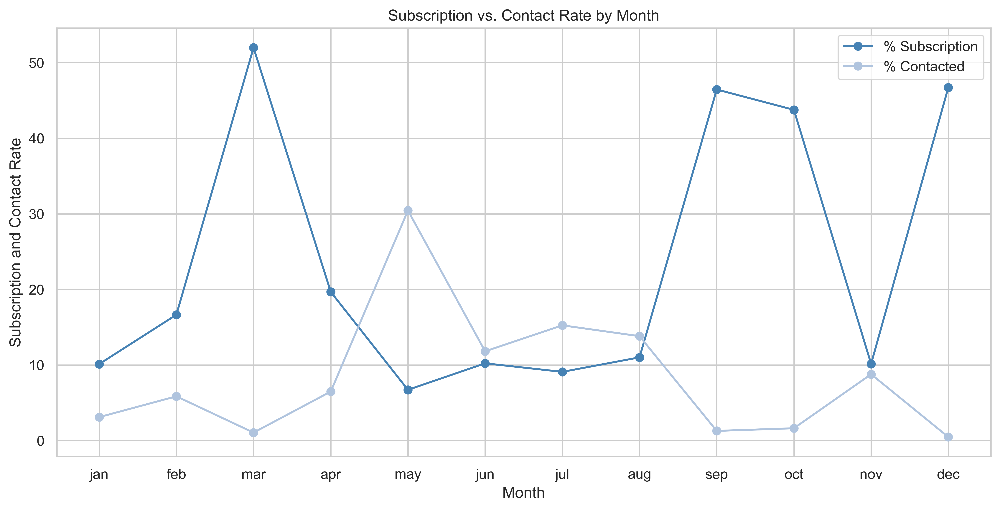

In [728]:
plot_month = month[['% Subscription','% Contacted']].plot(kind ='line',
                                                          color = ('steelblue','lightsteelblue'),
                                                          figsize = (13,6),
                                                          marker = 'o')

plt.title('Subscription vs. Contact Rate by Month')
plt.ylabel('Subscription and Contact Rate')
plt.xlabel('Month')

ticks = np.arange(0,12,1)
plt.xticks(ticks, month_sort)


____

## Modeling

The main objective of this project is to identify the most responsive customers before the marketing campaign so that the bank will be able to efficiently reach out to them, saving time and marketing resources. To achieve this objective, classification algorithms will be employed.

In [706]:
# Reuse the bank_client dataframe

print(bank_client.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   age            45211 non-null  int64  
 1   job            45211 non-null  object 
 2   marital        45211 non-null  object 
 3   education      45211 non-null  object 
 4   default        45211 non-null  object 
 5   balance        45211 non-null  int64  
 6   housing        45211 non-null  object 
 7   loan           45211 non-null  object 
 8   contact        45211 non-null  object 
 9   day            45211 non-null  int64  
 10  month          45211 non-null  object 
 11  duration       45211 non-null  int64  
 12  campaign       45211 non-null  int64  
 13  pdays          45211 non-null  int64  
 14  previous       45211 non-null  int64  
 15  poutcome       45211 non-null  object 
 16  y              45211 non-null  object 
 17  age_group      45211 non-null  float64
 18  balanc

In [707]:
bank_client.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,age_group,balance_group
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,50.0,average balance
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,40.0,low balance
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,30.0,low balance
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,40.0,average balance
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,30.0,low balance


### Feature Engineering

Selecting, Manipulating, and Transforming raw data into features that can be used in supervised learning. In order to make machine learning work well on new tasks, it might be necessary to design and train better features.


In [708]:
temp_df.loc[temp_df["age_group"] == 20.0, 'age_group'] = '<30'
temp_df.loc[temp_df["age_group"] == 30.0, 'age_group'] = '31-40'
temp_df.loc[temp_df["age_group"] == 40.0, 'age_group'] = '41-50'
temp_df.loc[temp_df["age_group"] == 50.0, 'age_group'] = '51-60'
temp_df.loc[temp_df["age_group"] == 60.0, 'age_group'] = '>60'

bank_client['age_group'].value_counts()

31-40    18089
41-50    11655
51-60     8410
<30       5273
>60       1784
Name: age_group, dtype: int64

In the analytics process we have added more features than before, including: age_group and balance_group

### Data Preparation 

**Data Cleansing**

Find a NULL value in dataset

In [709]:
bank_client.isna().sum()

age              0
job              0
marital          0
education        0
default          0
balance          0
housing          0
loan             0
contact          0
day              0
month            0
duration         0
campaign         0
pdays            0
previous         0
poutcome         0
y                0
age_group        0
balance_group    0
dtype: int64

Dataset does not contain missing data. <br>
This dataset has been cleaned quite completely so no further cleaning is required.

**Data Normalization**

Normalization is a rescaling of the data from the original range so that all values are within the new range <br>
We use **StandardScaler** Standardize features by removing the mean and scaling to unit variance.

In [710]:
scaler = StandardScaler()
scaled = scaler.fit_transform(bank_client[['balance', 'duration', 'pdays', 'previous']])

scaled = pd.DataFrame(scaled, columns =['balance', 'duration', 'pdays', 'previous'])
scaled.head()

,balance,duration,pdays,previous
0,0.256419,0.011016,-0.411453,-0.25194
1,-0.437895,-0.416127,-0.411453,-0.25194
2,-0.446762,-0.707361,-0.411453,-0.25194
3,0.047205,-0.645231,-0.411453,-0.25194
4,-0.447091,-0.233620,-0.411453,-0.25194


In [711]:
for i in scaled.columns:
    bank_client[i] = scaled[i]
bank_client_scaled = bank_client
bank_client_scaled.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,age_group,balance_group
0,58,management,married,tertiary,no,0.256419,yes,no,unknown,5,may,0.011016,1,-0.411453,-0.25194,unknown,no,51-60,average balance
1,44,technician,single,secondary,no,-0.437895,yes,no,unknown,5,may,-0.416127,1,-0.411453,-0.25194,unknown,no,41-50,low balance
2,33,entrepreneur,married,secondary,no,-0.446762,yes,yes,unknown,5,may,-0.707361,1,-0.411453,-0.25194,unknown,no,31-40,low balance
3,47,blue-collar,married,unknown,no,0.047205,yes,no,unknown,5,may,-0.645231,1,-0.411453,-0.25194,unknown,no,41-50,average balance
4,33,unknown,single,unknown,no,-0.447091,no,no,unknown,5,may,-0.233620,1,-0.411453,-0.25194,unknown,no,31-40,low balance


**Tranform categorical data into numerical**

Since machine learning algorithms only take numerical values, all five categorical variables (job, education, default, housing and loan) are transformed into dummy variables.

In [712]:
bank_client.dtypes

age                int64
job               object
marital           object
education         object
default           object
balance          float64
housing           object
loan              object
contact           object
day                int64
month             object
duration         float64
campaign           int64
pdays            float64
previous         float64
poutcome          object
y                 object
age_group         object
balance_group     object
dtype: object

From the analytical process, we have already grouped category features and numeric features but we have added 2 new features from the engineering feature which are category so we add them to the old grouping.

In [713]:
category_col = category_col.to_list()
category_col.extend(['age_group', 'balance_group'])
category_col.remove('y')
category_col

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome',
 'age_group',
 'balance_group']

In [714]:
bank_client['y'] = bank_client['y'].replace({'no': 0, 'yes': 1})
bank_client['y'].value_counts()

0    39922
1     5289
Name: y, dtype: int64

**OneHotEncoder**

Encode categorical features as a one-hot numeric array. <br>
The input to this transformer should be an array-like of integers or strings, denoting the values taken on by categorical (discrete) features. The features are encoded using a one-hot (aka ‘one-of-K’ or ‘dummy’) encoding scheme. This creates a binary column for each category and returns a sparse matrix or dense array (depending on the sparse_output parameter)

In [715]:
ce_OHE = ce.OneHotEncoder(cols=category_col)
bank_client_scaled_onehot = ce_OHE.fit_transform(bank_client_scaled)
bank_client_scaled_onehot.head()

,age,job_1,job_2,job_3,job_4,job_5,job_6,job_7,job_8,job_9,job_10,job_11,job_12,marital_1,marital_2,marital_3,education_1,education_2,education_3,education_4,default_1,default_2,balance,housing_1,housing_2,loan_1,loan_2,contact_1,contact_2,contact_3,day,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,duration,campaign,pdays,previous,poutcome_1,poutcome_2,poutcome_3,poutcome_4,y,age_group_1,age_group_2,age_group_3,age_group_4,age_group_5,balance_group_1,balance_group_2,balance_group_3,balance_group_4
0,58,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0.256419,1,0,1,0,1,0,0,5,1,0,0,0,0,0,0,0,0,0,0,0,0.011016,1,-0.411453,-0.25194,1,0,0,0,0,1,0,0,0,0,1,0,0,0
1,44,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,-0.437895,1,0,1,0,1,0,0,5,1,0,0,0,0,0,0,0,0,0,0,0,-0.416127,1,-0.411453,-0.25194,1,0,0,0,0,0,1,0,0,0,0,1,0,0
2,33,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,-0.446762,1,0,0,1,1,0,0,5,1,0,0,0,0,0,0,0,0,0,0,0,-0.707361,1,-0.411453,-0.25194,1,0,0,0,0,0,0,1,0,0,0,1,0,0
3,47,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0.047205,1,0,1,0,1,0,0,5,1,0,0,0,0,0,0,0,0,0,0,0,-0.645231,1,-0.411453,-0.25194,1,0,0,0,0,0,1,0,0,0,1,0,0,0
4,33,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,-0.447091,0,1,1,0,1,0,0,5,1,0,0,0,0,0,0,0,0,0,0,0,-0.233620,1,-0.411453,-0.25194,1,0,0,0,0,0,0,1,0,0,0,1,0,0


**Splitting of Data**

Split the data into training and test set so that we can fit and evaluate a learning model. We will use the **train_test_split()** function from scikit-learn and use 80 percent of the data for training and 20 percent for testing.

In [716]:
X = bank_client_scaled_onehot.drop(columns = ['y'])
y = bank_client_scaled_onehot['y']

print(x.shape, y.shape)

(45211, 60) (45211,)


In [717]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (33908, 60)
Number transactions y_train dataset:  (33908,)
Number transactions X_test dataset:  (11303, 60)
Number transactions y_test dataset:  (11303,)


In [718]:
print("Shape of labels Yes, No in X_test:\n", y_train.value_counts())
print("Shape of labels Yes, No in y_test:\n", y_test.value_counts())

Shape of labels Yes, No in X_test:
 0    29944
1     3964
Name: y, dtype: int64
Shape of labels Yes, No in y_test:
 0    9978
1    1325
Name: y, dtype: int64


From the size of label (Y/N). It's very different, which means that this set of data is imbalanced. Therefore, we should address this problem before using this data to build the model.

**Oversampling using SMOTE**

**SMOTE** stands for Synthetic Minority Oversampling Technique. <br>
SMOTE selects the nearest examples in the feature space, then draws a line between them, and at a point along the line, it creates a new sample.

In [719]:
# summarize class distribution
print(Counter(y_train))

# transform the dataset
oversample = SMOTE()
X_train_smote, y_train = oversample.fit_resample(X_train, y_train)

# summarize the new class distribution
print(Counter(y_train))

Counter({0: 29944, 1: 3964})
Counter({0: 29944, 1: 29944})


### Model Selection and Evaluation

In [720]:
# Ignore too many warnings
from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

Four different classification algorithms 
- Logistic Regression
- Linear Support Vector Machines
- K-Nearest Neighbors
- Decision Tree Regressor 

are run on the dataset and the best-performing one will be used to build the classification model.

In [721]:
# Logistic Regression
logr = LogisticRegression(random_state=0)
logr.fit(X_train_smote, y_train)

# Linear support vector machines
clf = LinearSVC(random_state=0)
clf.fit(X_train_smote, y_train)

# k-nearest neighbors
knn = KNeighborsClassifier()
knn.fit(X_train_smote, y_train)

# Decision Tree Regressor
tree = DecisionTreeRegressor(random_state=0)
tree.fit(X_train_smote, y_train)
print('---Before adjusting parameters by GridSearchCV---')
print('Training Set')
print("Accuracy of Logistic Regression on training set:", round(logr.score(X_train_smote, y_train), 3))
print("Accuracy of Linear support vector machines on training set:", round(clf.score(X_train_smote, y_train), 3))
print("Accuracy of k-nearest neighbors on training set:", round(knn.score(X_train_smote, y_train), 3))
print("Accuracy of Decision Tree Regressor on training set:", round(tree.score(X_train_smote, y_train), 3))

print('\nTest Set')
print("Accuracy of Logistic Regression on training set:", round(logr.score(X_test, y_test), 3))
print("Accuracy of Linear support vector machines on training set:", round(clf.score(X_test, y_test), 3))
print("Accuracy of k-nearest neighbors on training set:", round(knn.score(X_test, y_test), 3))
print("Accuracy of Decision Tree Regressor on training set:", round(tree.score(X_test, y_test), 3))

---Before adjusting parameters by GridSearchCV---
Training Set
Accuracy of Logistic Regression on training set: 0.937
Accuracy of Linear support vector machines on training set: 0.938
Accuracy of k-nearest neighbors on training set: 0.941
Accuracy of Decision Tree Regressor on training set: 1.0

Test Set
Accuracy of Logistic Regression on training set: 0.895
Accuracy of Linear support vector machines on training set: 0.886
Accuracy of k-nearest neighbors on training set: 0.822
Accuracy of Decision Tree Regressor on training set: -0.311


Decision Tree Regressor is not not suitable for the transformed data with SMOTE. <br>
Other models from the Train and Test Set tests showed overfitting.

**Model Selection**

1. Logistic Regression

In [722]:
# Logistic Regression

param_grid_logreg = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
logr_cv = GridSearchCV(logr, param_grid_logreg)

# training
logr_cv.fit(X_train_smote, y_train)
print("tuned hpyerparameters :(best parameters) ", logr_cv.best_params_)
print("best score of training set :", round(logr_cv.best_score_, 3))

tuned hpyerparameters :(best parameters)  {'C': 0.01}
best score of training set : 0.92


> Best Parameters: C = 0.01

2. Linear Support Vector Machines

In [723]:
# Linear Support Vector Machines

param_grid_LSVC = {'C':[0.001, 0.01, 0.1, 1, 10, 100]}
LSVC_cv = GridSearchCV(clf, param_grid_LSVC)

# training 
LSVC_cv.fit(X_train_smote, y_train)
print("tuned hpyerparameters :(best parameters) ", LSVC_cv.best_params_)
print("best score of training set :", round(LSVC_cv.best_score_, 3))

tuned hpyerparameters :(best parameters)  {'C': 0.001}
best score of training set : 0.922


> Best Parameters: C = 0.001

3. K-Nearest Neighbors

In [724]:
# K-Nearest Neighbors
param_grid_knn = {'n_neighbors':range(1,20)}
knn_cv = GridSearchCV(knn, param_grid_knn)

# training
knn_cv.fit(X_train_smote, y_train.values.ravel())
print("tuned hpyerparameters :(best parameters) ", knn_cv.best_params_)
print("best score of training set :", round(knn_cv.best_score_, 3))
print("\n")

tuned hpyerparameters :(best parameters)  {'n_neighbors': 2}
best score of training set : 0.949




> Best Parameters: n_neighbors = 2

Adjust the parameters of all 3 models according to the best parameters obtained from GridSearchCV.

In [725]:
# Logistic Regression
logr = LogisticRegression(C = 0.01, random_state=0)
logr.fit(X_train_smote, y_train)

# Linear support vector machines
clf = LinearSVC(C = 0.001, random_state=0)
clf.fit(X_train_smote, y_train)

# k-nearest neighbors
knn = KNeighborsClassifier(n_neighbors = 2)
knn.fit(X_train_smote, y_train)

print('---After adjusting parameters by GridSearchCV---')
print('Training Set')
print("Accuracy of Logistic Regression on training set:", round(logr.score(X_train_smote, y_train), 3))
print("Accuracy of Linear support vector machines on training set:", round(clf.score(X_train_smote, y_train), 3))
print("Accuracy of k-nearest neighbors on training set:", round(knn.score(X_train_smote, y_train), 3))

print('\nTest Set')
print("Accuracy of Logistic Regression on training set:", round(logr.score(X_test, y_test), 3))
print("Accuracy of Linear support vector machines on training set:", round(clf.score(X_test, y_test), 3))
print("Accuracy of k-nearest neighbors on training set:", round(knn.score(X_test, y_test), 3))

---After adjusting parameters by GridSearchCV---
Training Set
Accuracy of Logistic Regression on training set: 0.931
Accuracy of Linear support vector machines on training set: 0.934
Accuracy of k-nearest neighbors on training set: 0.998

Test Set
Accuracy of Logistic Regression on training set: 0.894
Accuracy of Linear support vector machines on training set: 0.896
Accuracy of k-nearest neighbors on training set: 0.867


After adjusting the parameters of all three models and testing them on the Training Set and Test Set data, it was found that k-nearest neighbors had the largest difference in accuracy from train and test, which was the highest overfit among the 3 models. 

For Logistic Regression and Linear support vector machines, the accuracy obtained from train and test is very similar. Therefore, it will be used classification_report in next step check

**classification_report**

Build a text report showing the main classification metrics.

In [726]:
pred_logr = logr.predict(X_test)
pred_clf = clf.predict(X_test)

print('Classification Report - Logistic Regression')
print(classification_report(y_test, pred_logr))
print('Classification Report - Linear Support Vector Machines')
print(classification_report(y_test, pred_clf))

Classification Report - Logistic Regression
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      9978
           1       0.55      0.53      0.54      1325

    accuracy                           0.89     11303
   macro avg       0.74      0.74      0.74     11303
weighted avg       0.89      0.89      0.89     11303

Classification Report - Linear Support Vector Machines
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      9978
           1       0.56      0.50      0.53      1325

    accuracy                           0.90     11303
   macro avg       0.75      0.72      0.74     11303
weighted avg       0.89      0.90      0.89     11303



Classification report shows the precision, recall, F1 and support scores for the LR classification model.

- Precision of 0 (the client said no) represents that for all instances predicted as no subscription.
- Recall is the ability of a classifier to find all positive instances. Recall of 0 indicates that for all clients that actually said no, the model predicts 100% correctly that they would decline the offer.

In general, the report shows those Logistic Regression and Linear Support Vector Machines differ only by 1% between precision and recall, but on average accuracy of both models, Linear Support Vector scores above 1% and Linear Support Vector is a more complex model Therefore, it was decided to use the linear support vector model.

In [727]:
clf_coef = pd.DataFrame(data= {'coef': clf.coef_[0]}, index=X_train.columns)
clf_coef = clf_coef.sort_values(by=['coef'], ascending=False)
clf_coef.reset_index(inplace=True)

clf_coef.plot.barh(x='index', y='coef', figsize=(25, 20))
plt.show()

### Conclusion

**Follow to the goals set**

1. How are you going to recommend to Business Unit to boost the following metrics:
    - conversion rate
	- sales volume
    
    **Ans:** According to previous analysis, a target customer profile can be established. The most responsive customers possess these features:

    Feature 1: age < 30 or age > 60 <br>
    Feature 2: students or retired people <br> 
    Feature 3: a balance of more than 5000 euros (High Balance) <br>

    By applying Linear Support Vector Machines algorithms, classification and estimation model were successfully built. With that model, the bank will be able to predict a customer's response to its telemarketing campaign before calling this customer. In this way, the bank can allocate more marketing efforts to the clients who are classified as highly likely to accept term deposits, and call less to those who are unlikely to make term deposits. This increases conversion rate and sales volume.

    Recommendations
    1. More appropriate timing: When implementing a marketing strategy, external factors, such as the time of calling, should also be carefully considered.
    2. Smarter marketing design: By targeting the right customers, the bank will have more and more positive responses.
    3. Better services provision: With a more granular understanding of its customer base, the bank has the ability to provide better banking services. <br>

    
2. If you can collect more data, what would you collect to improve the recommendation or the metrics?

    **Ans:** From the above dataset, if the collection can be improved The authors need more data from those who decide to subscribe because this dataset is imbalanced dataest, which makes analysis in some cases potentially inaccurate. <br>
    Likewise, from the above information, the customer's personal information is still too little, can add salary, credit card, address, etc. and the detailed campaign information is also too little, so in-depth analysis cannot be performed.
    
*Other answers are on the presentation.*

___